# Separate Br$\alpha$ from 4.1 micron continuum

This notebook walks through the process of trying to subtract the stellar continuum from the Br$\alpha$ image.

## Imports

In [1]:
from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
from photutils.detection import DAOStarFinder, IRAFStarFinder
from photutils.psf import DAOGroup, IntegratedGaussianPRF, extract_stars, IterativelySubtractedPSFPhotometry, BasicPSFPhotometry

/scratch/local/14833043/ipykernel_2005675/2258313207.py:1: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/scratch/local/14833043/ipykernel_2005675/2258313207.py:1: DeprecationWarning: `photutils.EPSFBuilder` is a deprecated alias for `photutils.psf.EPSFBuilder` and will be removed in the future. Instead, please use `from photutils.psf import EPSFBuilder` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/scratch/local/14833043/ipykernel_2005675/2258313207.py:1: DeprecationWarning: `photutils.find_peaks` is a deprecated alias for `photutils.detection.find_peaks` and will be removed in the future. Instead, please use `from photutils.detection import find_p

In [2]:
from photutils.background import MMMBackground, MADStdBackgroundRMS
from astropy.modeling.fitting import LevMarLSQFitter

In [3]:
from astropy import stats
from astropy.table import Table
from astropy.wcs import WCS

In [4]:
from astropy.io import fits

In [5]:
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy.visualization import simple_norm
from astropy import wcs
from astropy import table
from astropy import units as u
import pylab as pl
pl.rcParams['figure.facecolor'] = 'w'
pl.rcParams['image.origin'] = 'lower'

In [6]:
from astroquery.svo_fps import SvoFps

In [7]:
import numpy as np

In [8]:
import reproject

In [9]:
from astropy import units as u

## Load data

In [10]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [11]:
fh_405 = fits.open(f'{basepath}/F405N/pipeline/jw02221-o001_t001_nircam_clear-f405n-merged-reproject_i2d.fits')
fh_410 = fits.open(f'{basepath}/F410M/pipeline/jw02221-o001_t001_nircam_clear-f410m-merged-reproject_i2d.fits')

In [12]:
ww405 = wcs.WCS(fh_405['SCI'].header)
ww410 = wcs.WCS(fh_410['SCI'].header)

In [13]:
instrument = fh_405[0].header['INSTRUME']
telescope = fh_405[0].header['TELESCOP']
filt405 = fh_405[0].header['PUPIL']
wavelength_table_405 = SvoFps.get_transmission_data(f'{telescope}/{instrument}.{filt405}')
filt410 = fh_410[0].header['FILTER']
wavelength_table_410 = SvoFps.get_transmission_data(f'{telescope}/{instrument}.{filt410}')

In [14]:
filt405, filt410

('F405N', 'F410M')

## Theoretical transmission curves

In [15]:
waves_410 = wavelength_table_410['Wavelength']
trans_405 = np.interp(waves_410, wavelength_table_405['Wavelength'], wavelength_table_405['Transmission'])
trans_410 = wavelength_table_410['Transmission']

Text(0, 0.5, 'Fractional Transmission (from SVO-FPS)')

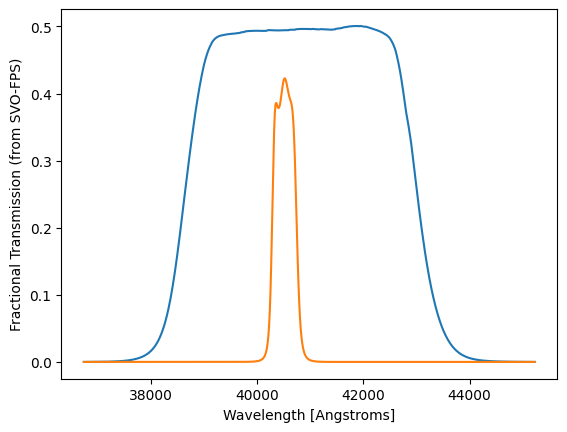

In [16]:
pl.plot(waves_410, trans_410)
pl.plot(waves_410, trans_405)
pl.xlabel("Wavelength [Angstroms]")
pl.ylabel("Fractional Transmission (from SVO-FPS)")

Text(0, 0.5, 'Norm. Fractional Transmission (from SVO-FPS)')

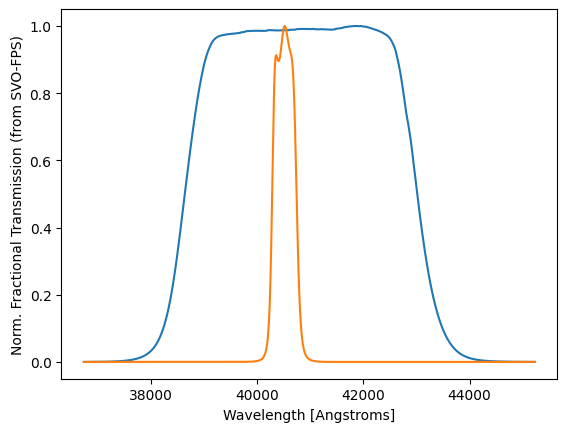

In [17]:
pl.plot(waves_410, trans_410/trans_410.max())
pl.plot(waves_410, trans_405/trans_405.max())
pl.xlabel("Wavelength [Angstroms]")
pl.ylabel("Norm. Fractional Transmission (from SVO-FPS)")

### Compare theory to empirical fractional bandwidth

The empirical number is computed later on, but we've copied the result up here.

In [18]:
fractional_bandwidth_405 = (( (trans_410/trans_410.max()) *
                            (trans_405/trans_405.max()) ).sum()
                            / (trans_410/trans_410.max()).sum()
                           )
fractional_bandwidth_405

0.1027882360899125

In [19]:
unnormalized_fractional_bandwidth_405 = (( (trans_410) * (trans_405) ).sum()
                            / (trans_410).sum()
                           )
unnormalized_fractional_bandwidth_405

0.04345938015999546

In [20]:
fraction_bandwidth_empirical = 0.1742 # see end of document

In [21]:
data_405_proj_410 = reproject.reproject_exact(fh_405['SCI'], fh_410['SCI'].header)

### We convolve F405N with a small Gaussian blur to match the F410M PSF

From PSF analysis below, we need to smooth the BrA data with an 0.3 pix gaussian

This is out of order because I went back and forth making visual comparisons

In [22]:
from astropy.convolution import convolve_fft, Gaussian2DKernel

## Direct Image Differencing

In [23]:
cont410_sub_bra = fh_410['SCI'].data - convolve_fft(data_405_proj_410[0]*fractional_bandwidth_405, Gaussian2DKernel(0.3))
fits.PrimaryHDU(data=cont410_sub_bra, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F410_minus_F405_merged-reproject_theoretical_bandwidth.fits', overwrite=True)

In [24]:
bra_minus_cont = data_405_proj_410[0] - cont410_sub_bra #* fractional_bandwidth_405
fits.PrimaryHDU(data=bra_minus_cont, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F405_minus_F410cont_merged-reproject_theoretical_bandwidth.fits', overwrite=True)

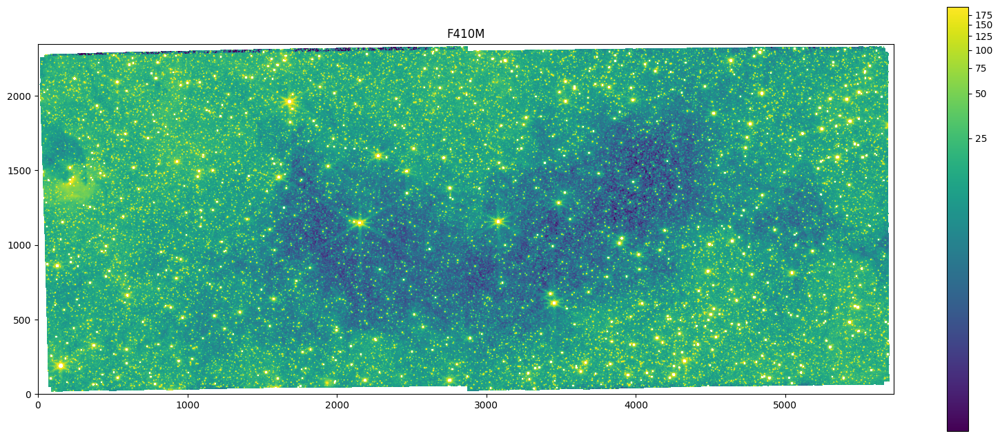

In [25]:
pl.figure(figsize=(20,8))
pl.imshow(fh_410['SCI'].data.T, norm=simple_norm(cont410_sub_bra, min_percent=1, max_percent=99, stretch='log'))
pl.colorbar()
pl.title("F410M");

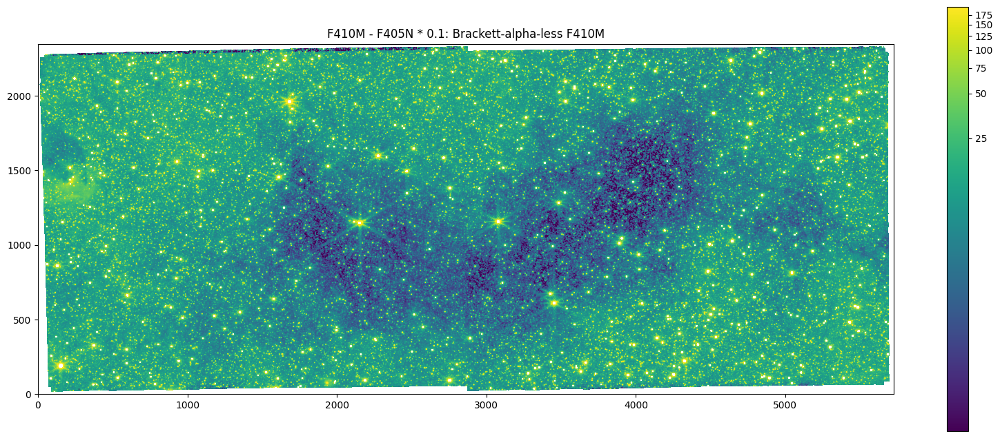

In [26]:
pl.figure(figsize=(20,8))
pl.imshow(cont410_sub_bra.T, norm=simple_norm(cont410_sub_bra, min_percent=1, max_percent=99, stretch='log'))
pl.colorbar()
pl.title("F410M - F405N * 0.1: Brackett-alpha-less F410M");

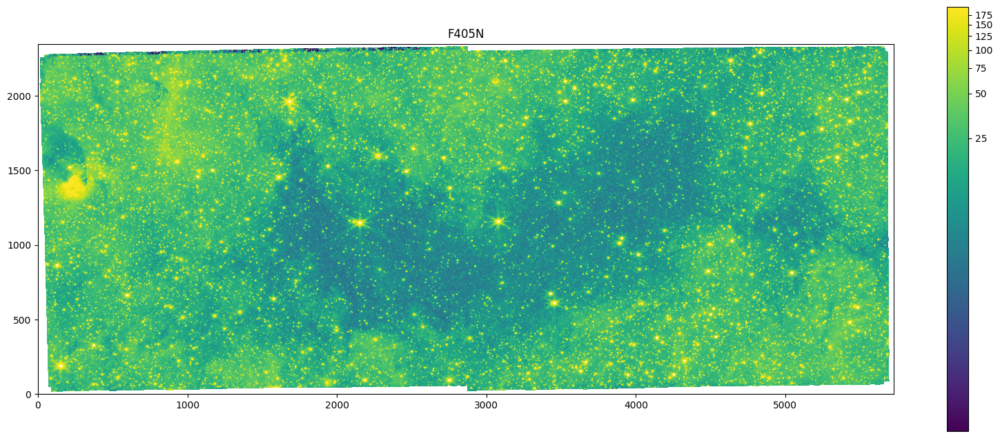

In [27]:
pl.figure(figsize=(20,8))
pl.imshow(fh_405['SCI'].data.T, norm=simple_norm(cont410_sub_bra, min_percent=1, max_percent=99, stretch='log'))
pl.colorbar()
pl.title("F405N");

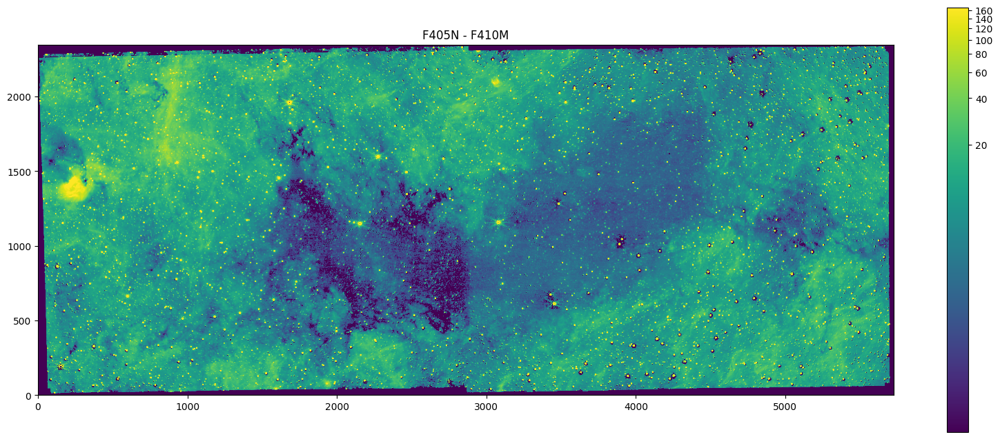

In [28]:
pl.figure(figsize=(20,8))
pl.imshow(np.nan_to_num(bra_minus_cont.T),
          norm=simple_norm(bra_minus_cont, min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()
pl.title('F405N - F410M');

## Zoom in of naive image 

In [29]:
class slcgt:
    """
    shorthand to go from slice syntax to a list of slices
    """
    def __getitem__(self, args):
        return args

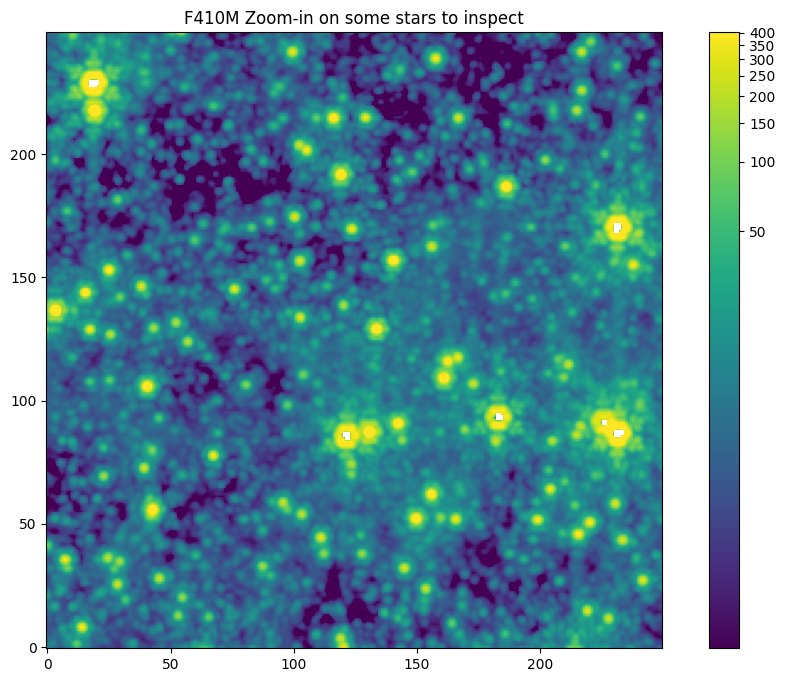

In [30]:
dd = fh_410['SCI'].data
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(dd[slc],
          norm=simple_norm(dd[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()
pl.title("F410M Zoom-in on some stars to inspect");

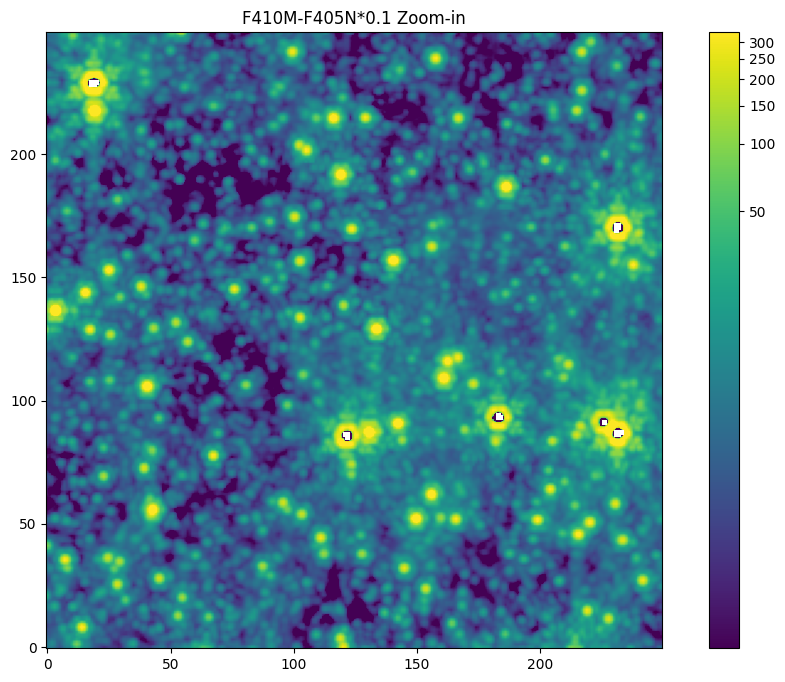

In [31]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(cont410_sub_bra[slc],
          norm=simple_norm(cont410_sub_bra[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()
pl.title("F410M-F405N*0.1 Zoom-in");

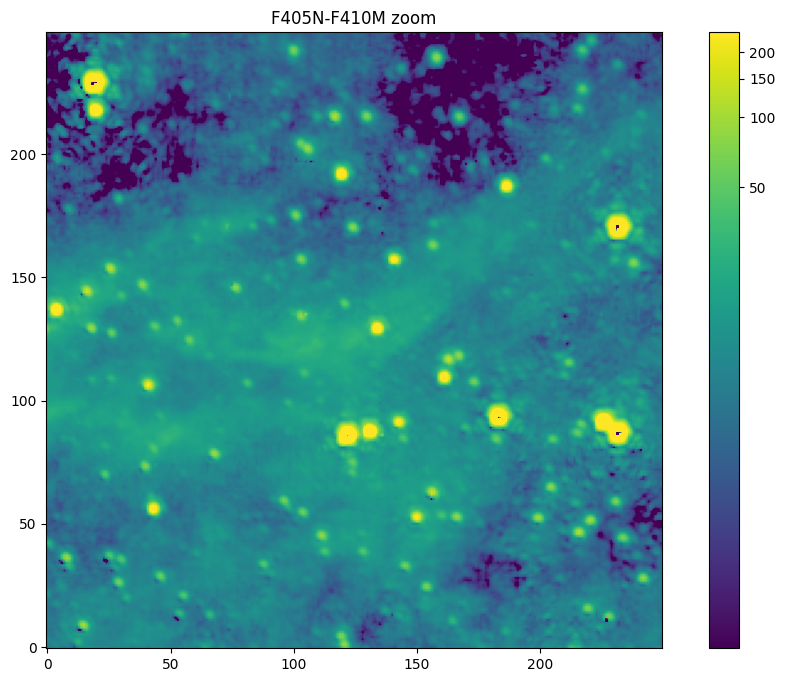

In [32]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(np.nan_to_num(bra_minus_cont[slc]),
          norm=simple_norm(bra_minus_cont[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()
pl.title("F405N-F410M zoom");

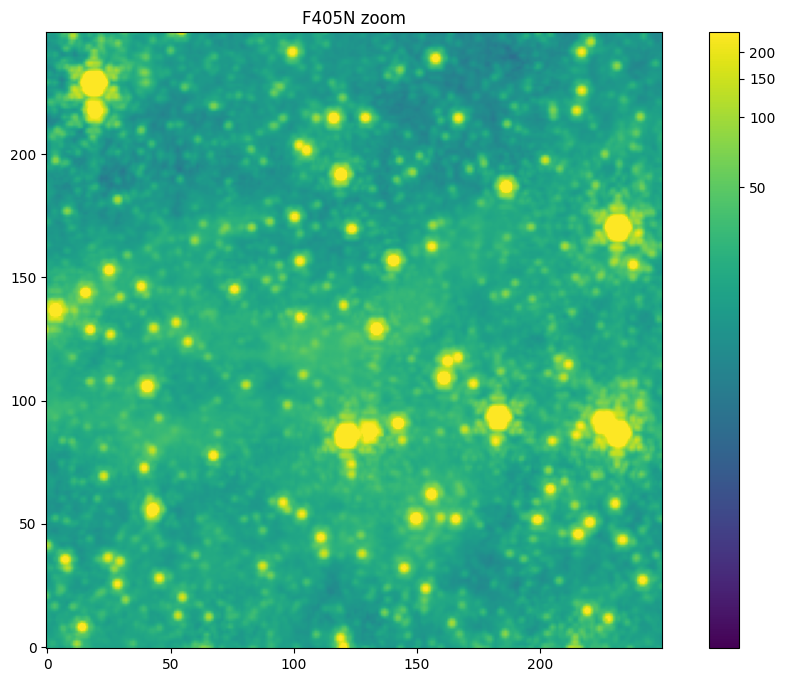

In [33]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(fh_405['SCI'].data[slc],
          norm=simple_norm(bra_minus_cont[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()
pl.title("F405N zoom");

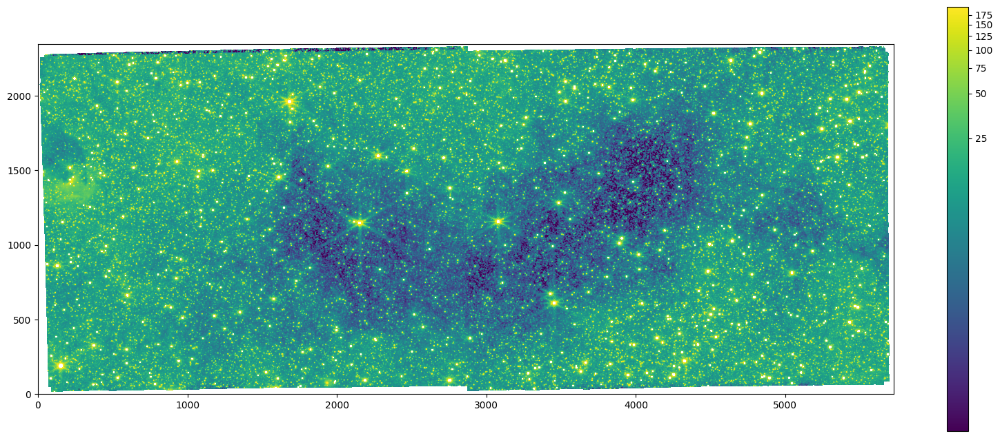

In [34]:
pl.figure(figsize=(20,8))
pl.imshow(cont410_sub_bra.T, norm=simple_norm(cont410_sub_bra, min_percent=1, max_percent=99, stretch='log'))
pl.colorbar();

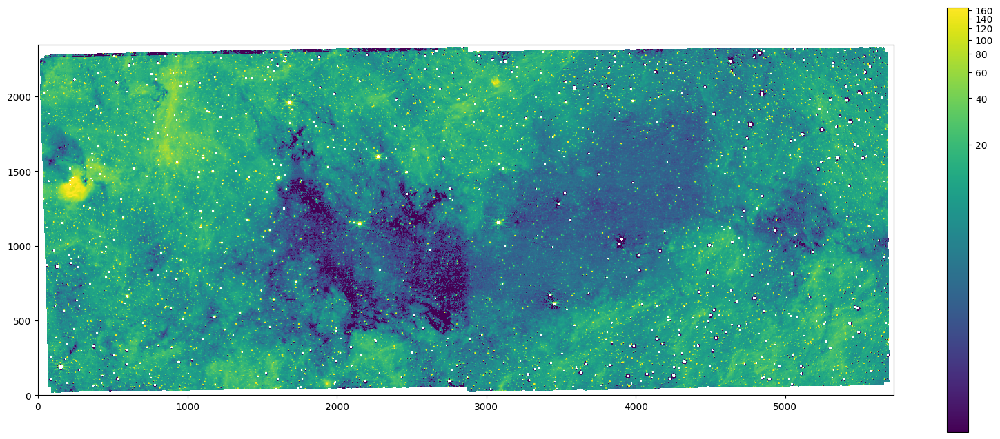

In [35]:
pl.figure(figsize=(20,8))
pl.imshow(bra_minus_cont.T, norm=simple_norm(bra_minus_cont, min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()

# Goal is to remove stars as completely as possible
we are not trying to measure H-alpha excess here but remove the stars entirely from the image to reveal the extended emission

if we were trying instead to measure stellar halpha excess, we'd want to stick to theory and/or match on something else (maybe extended emission)

### Load Table Data

In [36]:
%run $basepath/analysis/analysis_setup.py

/blue/adamginsburg/adamginsburg/jwst/brick/analysis/analysis_setup.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import sys, imp
/blue/adamginsburg/adamginsburg/jwst/brick/analysis/analysis_setup.py:19: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/adamginsburg/adamginsburg/jwst/brick/analysis/analysis_setup.py:19: DeprecationWarning: `photutils.EPSFBuilder` is a deprecated alias for `photutils.psf.EPSFBuilder` and will be removed in the future. Instead, please use `from photutils.psf import EPSFBuilder` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/ada

For module nrca catalog crowdsource_nsky0_nrca_photometry_tables_merged.fits, mod date is 2023-10-04 02:28:35
For module nrcb catalog crowdsource_nsky0_nrcb_photometry_tables_merged.fits, mod date is 2023-10-04 04:16:32
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2023-12-03 18:22:26
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2023-10-03 22:02:09


In [37]:
%run $basepath/analysis/selections.py --module=merged-reproject

/blue/adamginsburg/adamginsburg/jwst/brick/analysis/selections.py:18: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/adamginsburg/adamginsburg/jwst/brick/analysis/selections.py:18: DeprecationWarning: `photutils.EPSFBuilder` is a deprecated alias for `photutils.psf.EPSFBuilder` and will be removed in the future. Instead, please use `from photutils.psf import EPSFBuilder` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/adamginsburg/adamginsburg/jwst/brick/analysis/selections.py:18: DeprecationWarning: `photutils.find_peaks` is a deprecated alias for `photutils.detection.find_peaks` and will be removed in the future. Instead, please use `from 

For module nrca catalog crowdsource_nsky0_nrca_photometry_tables_merged.fits, mod date is 2023-10-04 02:28:35
For module nrcb catalog crowdsource_nsky0_nrcb_photometry_tables_merged.fits, mod date is 2023-10-04 04:16:32
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2023-12-03 18:22:26
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2023-10-03 22:02:09
Selecting module merged-reproject

NRCA
612 saturated in near_saturated_f212n_f212n
26 saturated in near_saturated_f466n_f466n
58 saturated in near_saturated_f405n_f405n
278 saturated in near_saturated_f187n_f187n
2757 saturated in near_saturated_f182m_f182m
4121 near saturated out of 295443.  That leaves 291322 not near unsaturated
70 saturated in replaced_saturated_f212n
10 saturated in replaced_saturated_f466n
31 saturated in replaced_saturated_f405n
19 saturated in replaced_saturated_f187n
117 saturated in replaced_saturat

In [38]:
ok = all_good
latest_scalefactor = np.median(1/(basetable['flux_f410m'][ok]/basetable['flux_f405n'][ok]))
latest_scalefactor

/orange/adamginsburg/miniconda3/envs/python39/lib/python3.9/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


1.0578653812408447

In [39]:
mergetbl = basetable_merged_reproject

### Plot from the actual photometry table
These stars should all be one-to-one

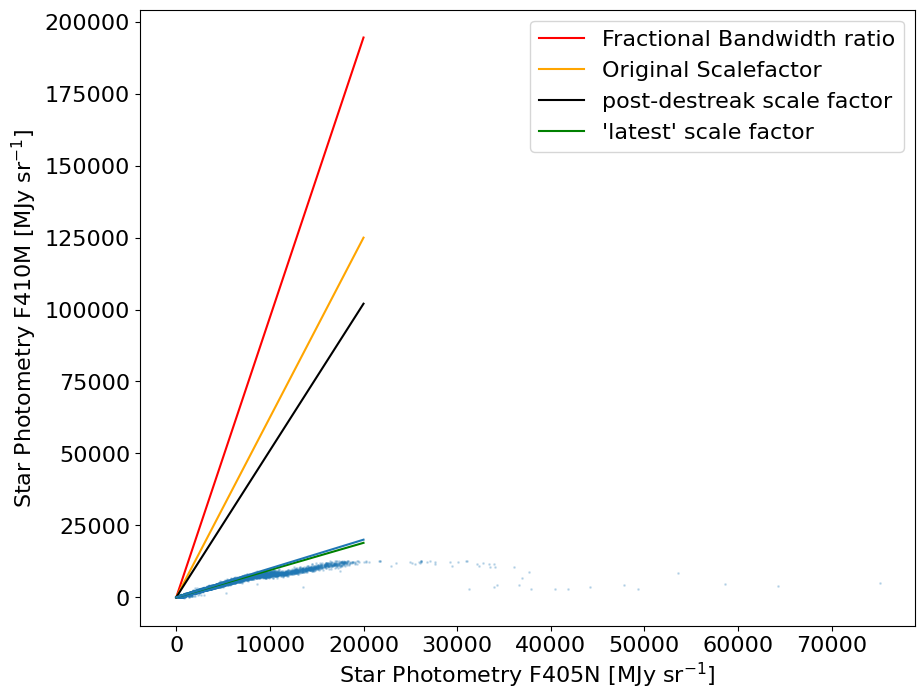

In [40]:
xr = np.linspace(0,20000)
pl.scatter(mergetbl['flux_f405n'][ok], mergetbl['flux_f410m'][ok], s=1, alpha=0.2)
pl.plot(xr, xr/fractional_bandwidth_405, color='red', label='Fractional Bandwidth ratio')
scalefactor = 0.16
pl.plot(xr, xr/scalefactor, color='orange', label="Original Scalefactor")
post_destreak_scalefactor = 0.196
pl.plot(xr, xr/post_destreak_scalefactor, color='black', label="post-destreak scale factor")
pl.plot(xr, xr/latest_scalefactor, color='green', label="'latest' scale factor")
pl.plot([0,20000], [0,20000])
pl.legend(loc='best')
pl.xlabel("Star Photometry F405N [MJy sr$^{-1}$]")
pl.ylabel("Star Photometry F410M [MJy sr$^{-1}$]");

Text(0.5, 0, 'F405N/F410M Star Fluxes')

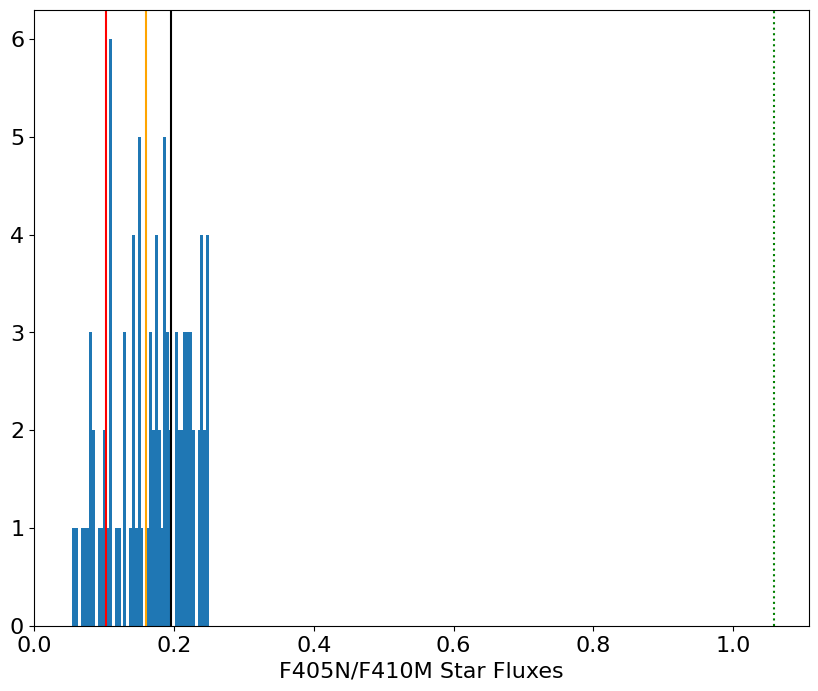

In [41]:
pl.hist(1/(mergetbl['flux_f410m'][ok]/mergetbl['flux_f405n'][ok]), bins=np.linspace(0.05,0.25))
pl.axvline(scalefactor, color='orange')
pl.axvline(post_destreak_scalefactor, color='black')
pl.axvline(fractional_bandwidth_405, color='red')
pl.axvline(latest_scalefactor, color='green', linestyle=':')
pl.xlabel("F405N/F410M Star Fluxes")

# Refit Astrometry, reproject, before differencing

## Improve alignment and re-do subtraction

This shouldn't be necessary any more, but it was once.

Starfinding on unsubtracted data so we can do some spatial cross-matching.

In [42]:
stars_bra = DAOStarFinder(threshold=60, fwhm=2.302, peakmax=1e4)(fh_405['SCI'].data)
stars_bra['skycoord'] = ww405.pixel_to_world(stars_bra['xcentroid'], stars_bra['ycentroid'])
len(stars_bra)

20828

In [43]:
stars_410 = DAOStarFinder(threshold=10, fwhm=2.302, peakmax=900)(fh_410['SCI'].data)
stars_410['skycoord'] = ww410.pixel_to_world(stars_410['xcentroid'], stars_410['ycentroid'])
len(stars_410)

81241

In [44]:
matches, sep, _ = stars_bra['skycoord'].match_to_catalog_sky(stars_410['skycoord'], nthneighbor=1)

for cn in stars_bra.colnames:
    stars_bra.rename_column(cn, f"{cn}_405")
for cn in stars_410.colnames:
    stars_410.rename_column(cn, f"{cn}_410")
                         
stars_bra.add_column(name="sep_410_405", col=sep)
stars_bra.add_column(name="id_410_405", col=matches)
mergetbl = table.hstack([stars_bra, stars_410[matches]], join_type='exact')

(array([1.8474e+04, 4.5700e+02, 6.7400e+02, 9.3400e+02, 1.8700e+02,
        6.8000e+01, 2.1000e+01, 9.0000e+00, 2.0000e+00, 2.0000e+00]),
 array([1.77909268e-04, 1.46208148e-01, 2.92238388e-01, 4.38268627e-01,
        5.84298866e-01, 7.30329105e-01, 8.76359344e-01, 1.02238958e+00,
        1.16841982e+00, 1.31445006e+00, 1.46048030e+00]),
 <BarContainer object of 10 artists>)

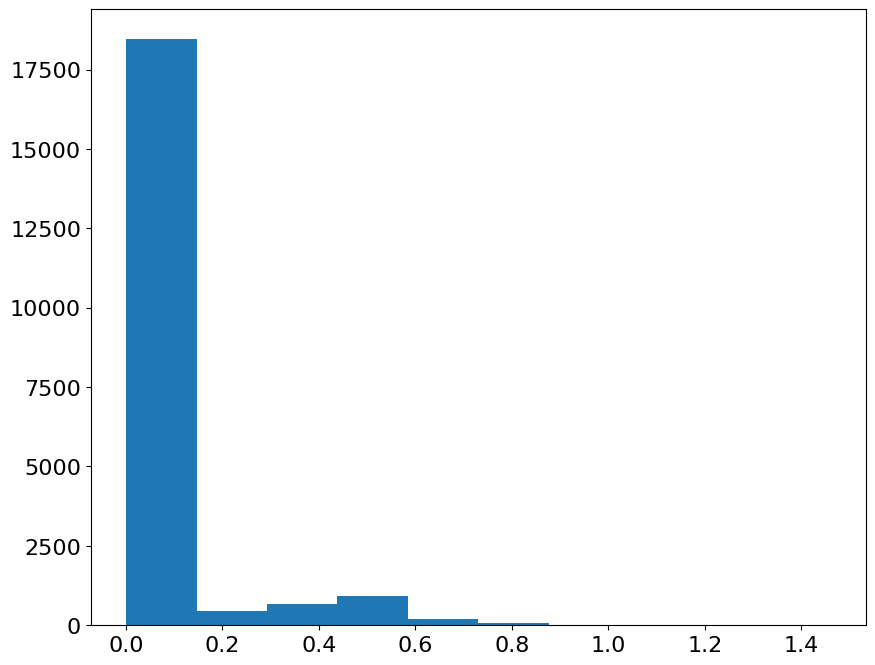

In [45]:
pl.hist(mergetbl['sep_410_405'].to(u.arcsec).value)

(-0.5, 0.5, -0.5, 0.5)

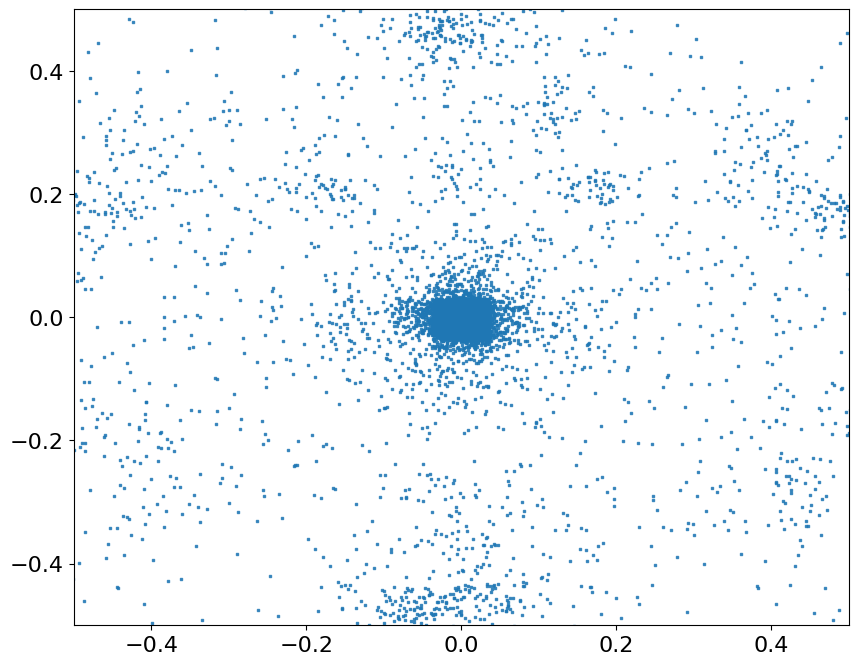

In [46]:
radiff = (mergetbl['skycoord_405'].ra - mergetbl['skycoord_410'].ra).to(u.arcsec)
decdiff = (mergetbl['skycoord_405'].dec - mergetbl['skycoord_410'].dec).to(u.arcsec)
pl.scatter(radiff, decdiff, marker=',', s=1, alpha=0.8)
pl.axis([-0.5,0.5,-0.5,0.5])

Text(0, 0.5, 'Dec offset')

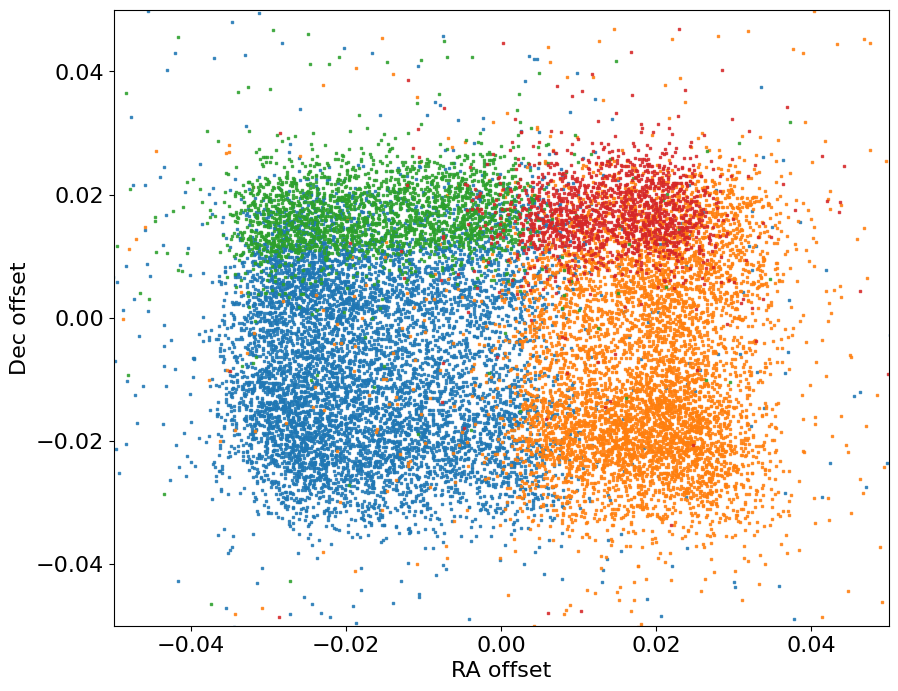

In [47]:
pl.figure(figsize=(10,8))
radiff = (mergetbl['skycoord_405'].ra - mergetbl['skycoord_410'].ra).to(u.arcsec)
decdiff = (mergetbl['skycoord_405'].dec - mergetbl['skycoord_410'].dec).to(u.arcsec)
topleft = (mergetbl['xcentroid_405'] < 1424) & (mergetbl['ycentroid_405'] > 1024)
pl.scatter(radiff[topleft], decdiff[topleft], marker=',', s=1, alpha=0.8)
topright = (mergetbl['xcentroid_405'] > 1424) & (mergetbl['ycentroid_405'] > 1024)
pl.scatter(radiff[topright], decdiff[topright], marker=',', s=1, alpha=0.8)
bottomleft = (mergetbl['xcentroid_405'] < 1424) & (mergetbl['ycentroid_405'] < 1024)
pl.scatter(radiff[bottomleft], decdiff[bottomleft], marker=',', s=1, alpha=0.8)
bottomright = (mergetbl['xcentroid_405'] > 1424) & (mergetbl['ycentroid_405'] < 1024)
pl.scatter(radiff[bottomright], decdiff[bottomright], marker=',', s=1, alpha=0.8)
pl.axis([-0.05,0.05,-0.05,0.05])
pl.xlabel("RA offset")
pl.ylabel("Dec offset")

In [48]:
mergetbl['xcentroid_405'].max(), mergetbl['ycentroid_405'].max()

(2331.1792417248075, 5686.86608382301)

In [49]:
dist_from_center = ((mergetbl['xcentroid_405'] - 1450)**2 + (mergetbl['ycentroid_405'] - 1145)**2)**0.5

Text(0, 0.5, 'Offset from F410 (arcseconds)')

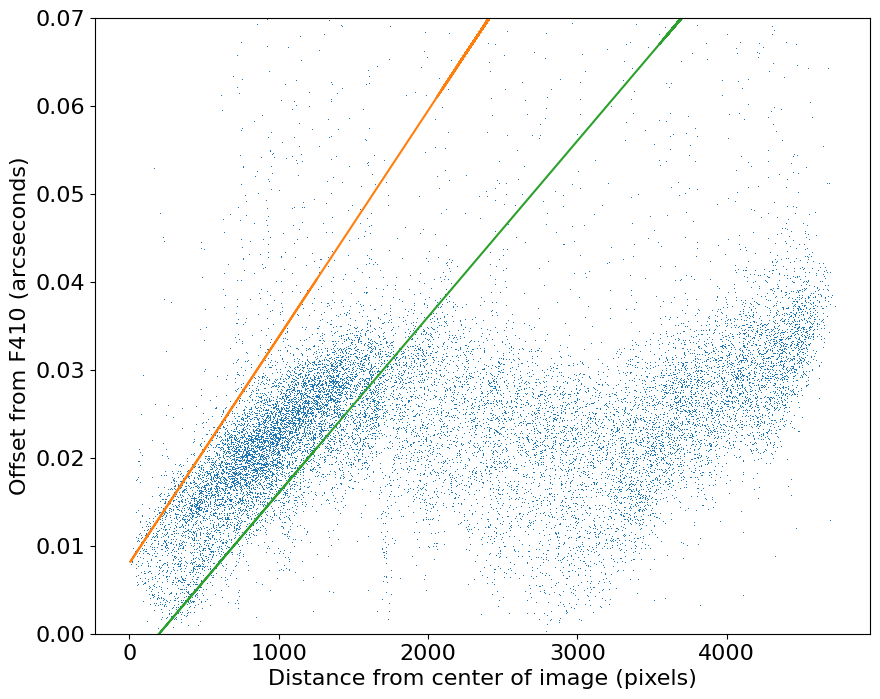

In [50]:
pl.plot(dist_from_center, mergetbl['sep_410_405'].to(u.arcsec).value, ',')
pl.plot(dist_from_center, dist_from_center/1750 * 0.045 + 0.008)
pl.plot(dist_from_center, dist_from_center/1750 * 0.035 - 0.004)
pl.ylim(0,0.07)
pl.xlabel("Distance from center of image (pixels)")
pl.ylabel("Offset from F410 (arcseconds)")

The distortion is nearly linear, for part of the image.

This was a big discovery early on when I was still trying to get the images aligned.

In [51]:
ok = (mergetbl['sep_410_405'] < 0.05*u.arcsec) & (mergetbl['sep_410_405'] < (dist_from_center/1750*0.045 +0.08) *u.arcsec) & (mergetbl['sep_410_405'] > (dist_from_center/1750*0.035 - 0.08) *u.arcsec)

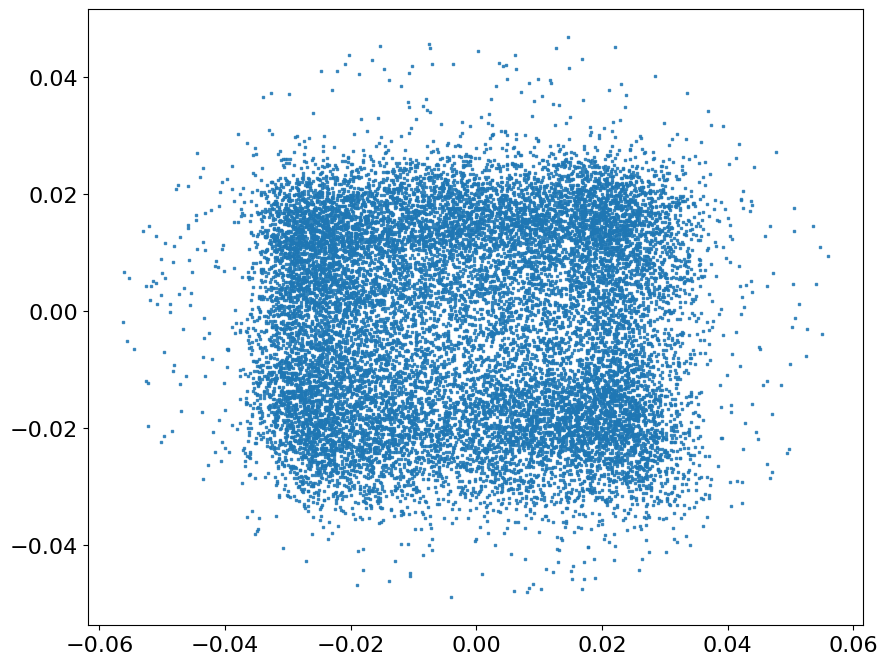

In [52]:
radiff = (mergetbl['skycoord_405'].ra - mergetbl['skycoord_410'].ra).to(u.arcsec)
decdiff = (mergetbl['skycoord_405'].dec - mergetbl['skycoord_410'].dec).to(u.arcsec)
pl.scatter(radiff[ok], decdiff[ok], marker=',', s=1, alpha=0.8)

In [53]:
from astropy.wcs.utils import fit_wcs_from_points

In [54]:
ww_405_refit = fit_wcs_from_points([mergetbl['xcentroid_405'][ok], mergetbl['ycentroid_405'][ok]], mergetbl['skycoord_410'][ok], sip_degree=1)

In [55]:
ww_410_refit = fit_wcs_from_points([mergetbl['xcentroid_410'][ok], mergetbl['ycentroid_410'][ok]], mergetbl['skycoord_405'][ok], sip_degree=3)

In [56]:
skycoord_410_refit = ww_410_refit.pixel_to_world(mergetbl['xcentroid_410'], mergetbl['ycentroid_410'])

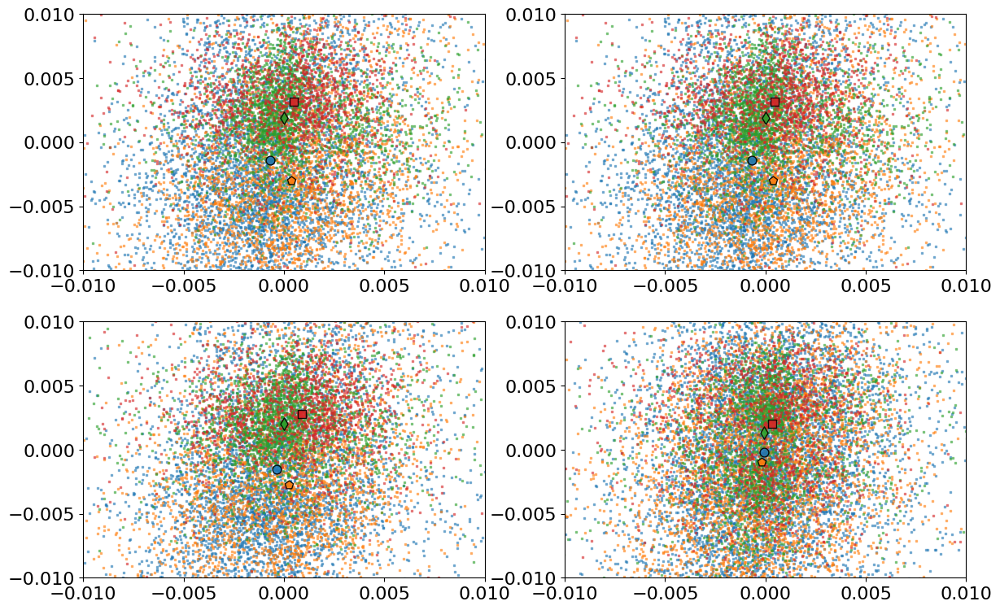

In [57]:
pl.figure(figsize=(14,9))
for sip_degree in (0,1,2,3):
    pl.subplot(2,2,sip_degree+1)
    
    ww_410_refit = fit_wcs_from_points([mergetbl['xcentroid_410'][ok], mergetbl['ycentroid_410'][ok]], mergetbl['skycoord_405'][ok], sip_degree=sip_degree)
    skycoord_410_refit = ww_410_refit.pixel_to_world(mergetbl['xcentroid_410'], mergetbl['ycentroid_410'])
    radiff = (mergetbl['skycoord_405'].ra - skycoord_410_refit.ra).to(u.arcsec)
    decdiff = (mergetbl['skycoord_405'].dec - skycoord_410_refit.dec).to(u.arcsec)
    sep = (radiff**2 + decdiff**2)**0.5
    ww_410_refit = fit_wcs_from_points([mergetbl['xcentroid_410'][ok & (sep < 0.01*u.arcsec)], mergetbl['ycentroid_410'][ok & (sep < 0.01*u.arcsec)]], mergetbl['skycoord_405'][ok & (sep < 0.01*u.arcsec)], sip_degree=sip_degree)
    skycoord_410_refit = ww_410_refit.pixel_to_world(mergetbl['xcentroid_410'], mergetbl['ycentroid_410'])
    radiff = (mergetbl['skycoord_405'].ra - skycoord_410_refit.ra).to(u.arcsec)
    decdiff = (mergetbl['skycoord_405'].dec - skycoord_410_refit.dec).to(u.arcsec)
    sep = (radiff**2 + decdiff**2)**0.5
    
    topleft = (mergetbl['xcentroid_405'] < 1424) & (mergetbl['ycentroid_405'] > 1024)
    sc = pl.scatter(radiff[topleft], decdiff[topleft], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[topleft]), np.median(decdiff[topleft]), marker='o', alpha=0.9, c=sc.get_facecolors(), zorder=15, edgecolors='k', s=60)
    topright = (mergetbl['xcentroid_405'] > 1424) & (mergetbl['ycentroid_405'] > 1024)
    sc = pl.scatter(radiff[topright], decdiff[topright], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[topright]), np.median(decdiff[topright]), marker='p', alpha=0.9, c=sc.get_facecolors(), zorder=15, edgecolors='k', s=60)
    bottomleft = (mergetbl['xcentroid_405'] < 1424) & (mergetbl['ycentroid_405'] < 1024)
    sc = pl.scatter(radiff[bottomleft], decdiff[bottomleft], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[bottomleft]), np.median(decdiff[bottomleft]), marker='d', alpha=0.9, c=sc.get_facecolors(), zorder=15, edgecolors='k', s=60)
    bottomright = (mergetbl['xcentroid_405'] > 1424) & (mergetbl['ycentroid_405'] < 1024)
    sc = pl.scatter(radiff[bottomright], decdiff[bottomright], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[bottomright]), np.median(decdiff[bottomright]), marker='s', alpha=0.9, c=sc.get_facecolors(), zorder=25, edgecolors='k', s=60)
    pl.axis([-0.01,0.01,-0.01,0.01])

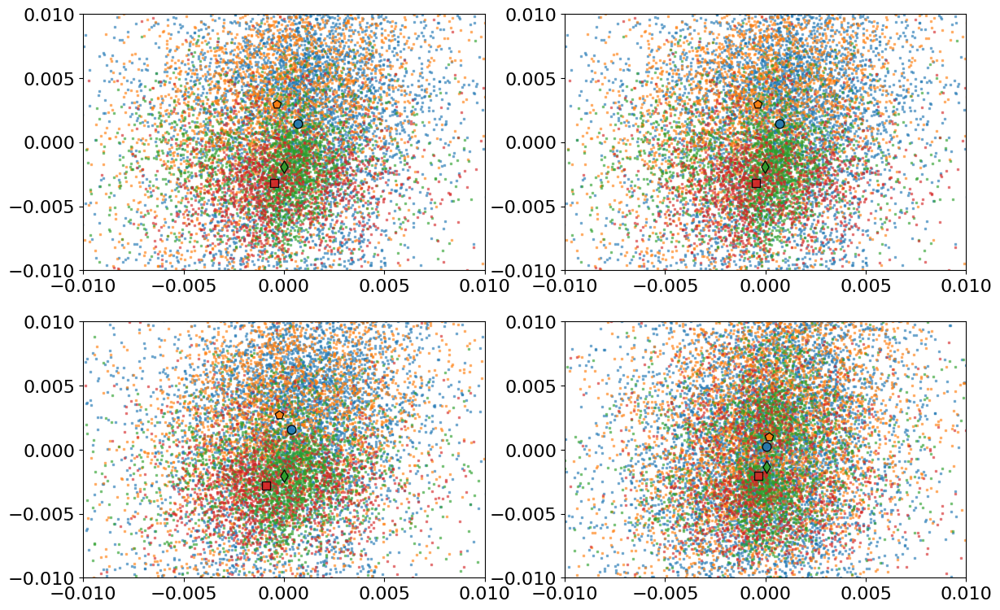

In [58]:
pl.figure(figsize=(14,9))
for sip_degree in (0,1,2,3):
    pl.subplot(2,2,sip_degree+1)
    
    ww_405_refit = fit_wcs_from_points([mergetbl['xcentroid_405'][ok], mergetbl['ycentroid_405'][ok]], mergetbl['skycoord_410'][ok], sip_degree=sip_degree)
    skycoord_405_refit = ww_405_refit.pixel_to_world(mergetbl['xcentroid_405'], mergetbl['ycentroid_405'])
    radiff = (mergetbl['skycoord_410'].ra - skycoord_405_refit.ra).to(u.arcsec)
    decdiff = (mergetbl['skycoord_410'].dec - skycoord_405_refit.dec).to(u.arcsec)
    sep = (radiff**2 + decdiff**2)**0.5
    ww_405_refit = fit_wcs_from_points([mergetbl['xcentroid_405'][ok & (sep < 0.01*u.arcsec)], mergetbl['ycentroid_405'][ok & (sep < 0.01*u.arcsec)]], mergetbl['skycoord_410'][ok & (sep < 0.01*u.arcsec)], sip_degree=sip_degree)
    skycoord_405_refit = ww_405_refit.pixel_to_world(mergetbl['xcentroid_405'], mergetbl['ycentroid_405'])
    radiff = (mergetbl['skycoord_410'].ra - skycoord_405_refit.ra).to(u.arcsec)
    decdiff = (mergetbl['skycoord_410'].dec - skycoord_405_refit.dec).to(u.arcsec)
    sep = (radiff**2 + decdiff**2)**0.5
    
    topleft = (mergetbl['xcentroid_405'] < 1424) & (mergetbl['ycentroid_405'] > 1024)
    sc = pl.scatter(radiff[topleft], decdiff[topleft], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[topleft]), np.median(decdiff[topleft]), marker='o', alpha=0.9, c=sc.get_facecolors(), zorder=15, edgecolors='k', s=60)
    topright = (mergetbl['xcentroid_405'] > 1424) & (mergetbl['ycentroid_405'] > 1024)
    sc = pl.scatter(radiff[topright], decdiff[topright], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[topright]), np.median(decdiff[topright]), marker='p', alpha=0.9, c=sc.get_facecolors(), zorder=15, edgecolors='k', s=60)
    bottomleft = (mergetbl['xcentroid_405'] < 1424) & (mergetbl['ycentroid_405'] < 1024)
    sc = pl.scatter(radiff[bottomleft], decdiff[bottomleft], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[bottomleft]), np.median(decdiff[bottomleft]), marker='d', alpha=0.9, c=sc.get_facecolors(), zorder=15, edgecolors='k', s=60)
    bottomright = (mergetbl['xcentroid_405'] > 1424) & (mergetbl['ycentroid_405'] < 1024)
    sc = pl.scatter(radiff[bottomright], decdiff[bottomright], marker=',', s=1, alpha=0.5)
    pl.scatter(np.median(radiff[bottomright]), np.median(decdiff[bottomright]), marker='s', alpha=0.9, c=sc.get_facecolors(), zorder=25, edgecolors='k', s=60)
    pl.axis([-0.01,0.01,-0.01,0.01])

In [59]:
sip_degree = 3
ww_405_refit = fit_wcs_from_points([mergetbl['xcentroid_405'][ok], mergetbl['ycentroid_405'][ok]], mergetbl['skycoord_410'][ok], sip_degree=sip_degree)
skycoord_405_refit = ww_405_refit.pixel_to_world(mergetbl['xcentroid_405'], mergetbl['ycentroid_405'])
radiff = (mergetbl['skycoord_410'].ra - skycoord_405_refit.ra).to(u.arcsec)
decdiff = (mergetbl['skycoord_410'].dec - skycoord_405_refit.dec).to(u.arcsec)
sep = (radiff**2 + decdiff**2)**0.5
ww_405_refit = fit_wcs_from_points([mergetbl['xcentroid_405'][ok & (sep < 0.01*u.arcsec)], mergetbl['ycentroid_405'][ok & (sep < 0.01*u.arcsec)]], mergetbl['skycoord_410'][ok & (sep < 0.01*u.arcsec)], sip_degree=sip_degree)
skycoord_405_refit = ww_405_refit.pixel_to_world(mergetbl['xcentroid_405'], mergetbl['ycentroid_405'])
radiff = (mergetbl['skycoord_410'].ra - skycoord_405_refit.ra).to(u.arcsec)
decdiff = (mergetbl['skycoord_410'].dec - skycoord_405_refit.dec).to(u.arcsec)
sep = (radiff**2 + decdiff**2)**0.5


In [60]:
ww_405_refit.to_header(relax=True).totextfile(f'{basepath}/reduction/headers/f405n_merged-reproject_refitted_to_f410m.hdr', overwrite=True)

In [61]:
data_405_proj_410_refit, overlap_refit = reproject.reproject_exact((fh_405['SCI'].data, ww_405_refit), fh_410['SCI'].header)

In [62]:
fits.PrimaryHDU(data=data_405_proj_410_refit, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F405_refitted405wcsto410_merged-reproject.fits', overwrite=True)

In [63]:
cont410_sub_bra = fh_410['SCI'].data - data_405_proj_410_refit*fractional_bandwidth_405
fits.PrimaryHDU(data=cont410_sub_bra, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F410_minus_F405_refitted405wcsto410_merged-reproject.fits', overwrite=True)

In [64]:
bra_minus_cont = data_405_proj_410_refit - cont410_sub_bra #* fractional_bandwidth_405
fits.PrimaryHDU(data=bra_minus_cont, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F405_minus_F410cont_refitted405wcsto410_merged-reproject.fits', overwrite=True)

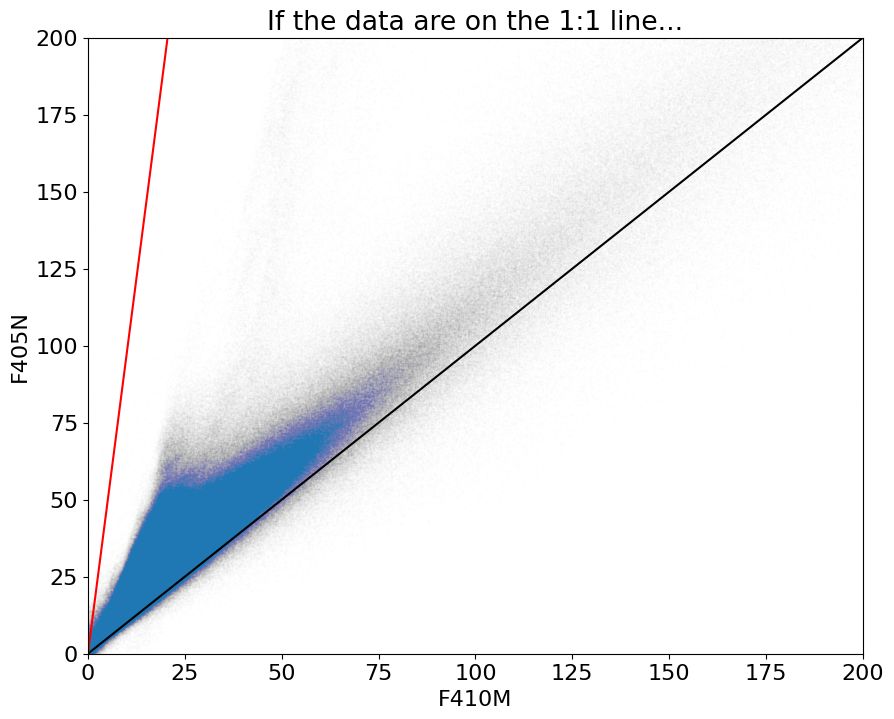

In [65]:
pl.scatter(fh_410['SCI'].data, data_405_proj_410_refit, s=1, alpha=0.005)
pl.plot([0,1000], [0,1000], color='k')
pl.plot([0,1000], [0,1000/fractional_bandwidth_405], color='r')
pl.axis([0,200,0,200]);
pl.xlabel("F410M")
pl.ylabel("F405N")
pl.title("If the data are on the 1:1 line...");

Text(0.5, 1.0, 'The peak at 1.5x indicates that a large fraction of pixels are starry')

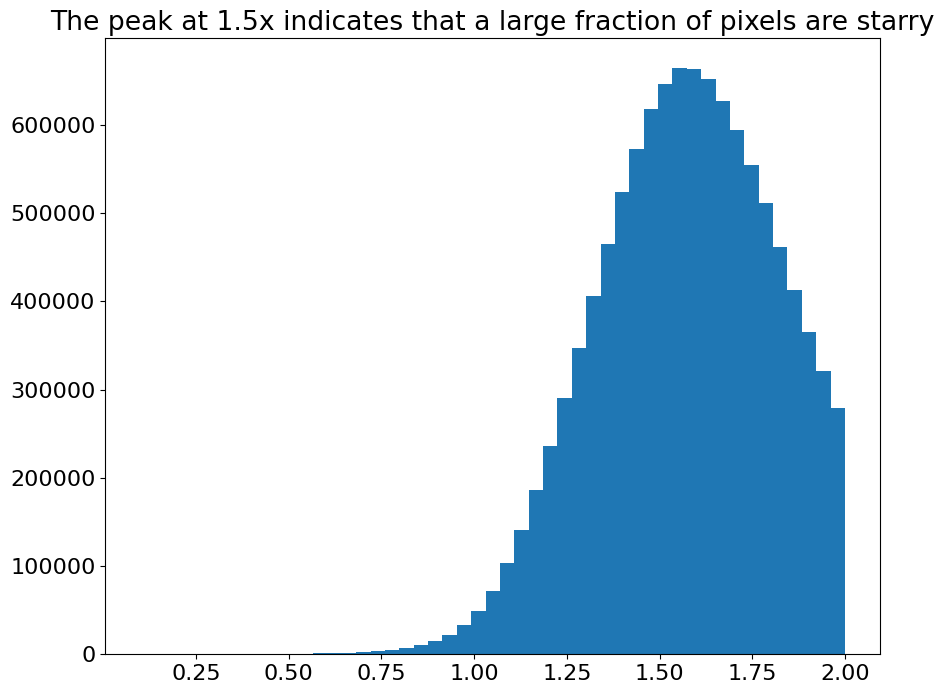

In [66]:
pl.hist((data_405_proj_410_refit / fh_410['SCI'].data)[(fh_410['SCI'].data < 200) & (data_405_proj_410_refit < 100)],
        bins=np.linspace(0.1,2));
pl.title("The peak at 1.5x indicates that a large fraction of pixels are starry")

### Re-examine the images afer the empirical subtraction

In [67]:
cont410_sub_bra = fh_410['SCI'].data - convolve_fft(data_405_proj_410_refit*latest_scalefactor, Gaussian2DKernel(0.3))
fits.PrimaryHDU(data=cont410_sub_bra, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F410_minus_F405_refitted405wcsto410_merged-reproject.fits', overwrite=True)

In [68]:
bra_minus_cont = data_405_proj_410_refit - cont410_sub_bra#convolve_fft(cont410_sub_bra, Gaussian2DKernel(0.5)) #* fractional_bandwidth_405
fits.PrimaryHDU(data=bra_minus_cont, header=fh_410['SCI'].header).writeto(f'{basepath}/images/F405_minus_F410cont_refitted405wcsto410_merged-reproject.fits', overwrite=True)

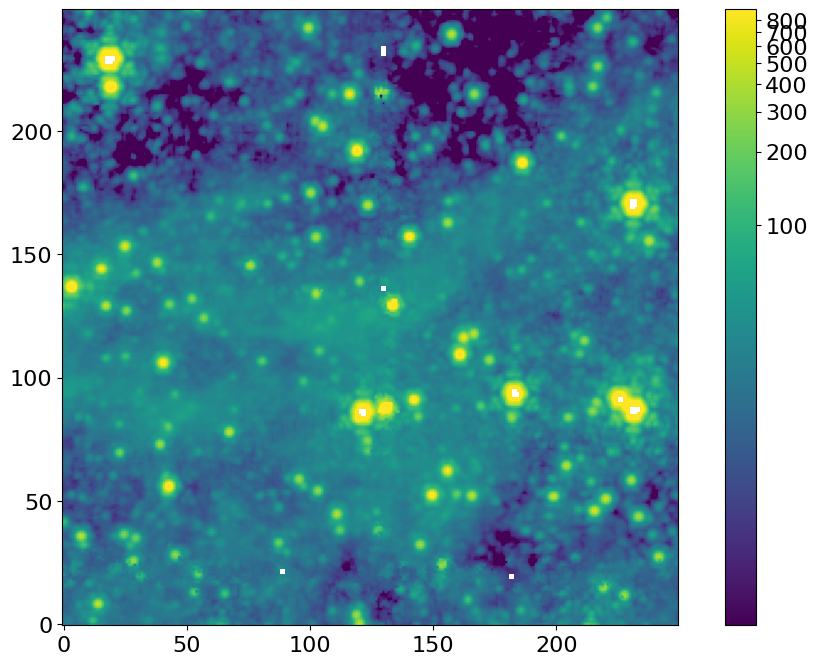

In [69]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(bra_minus_cont[slc],
          norm=simple_norm(bra_minus_cont[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()

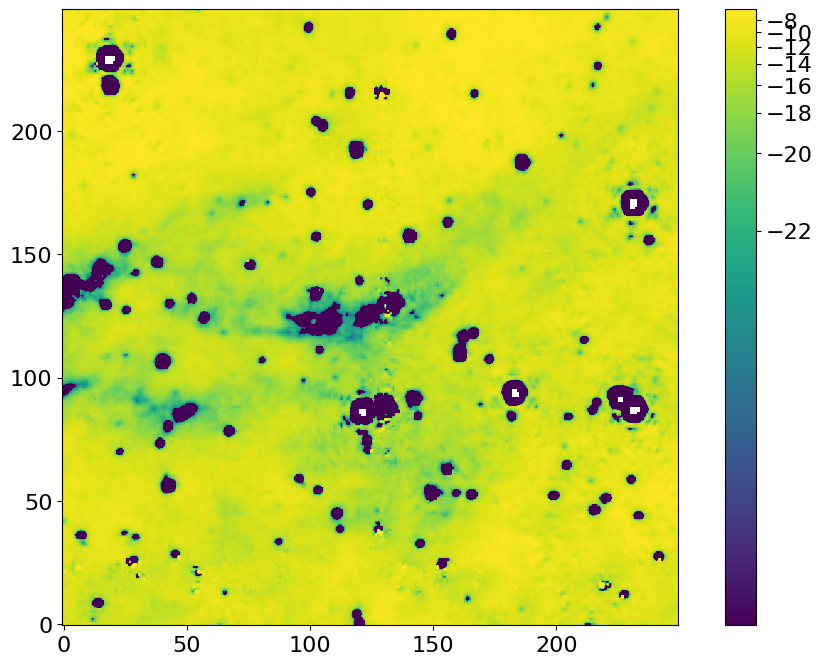

In [70]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(cont410_sub_bra[slc],
          norm=simple_norm(cont410_sub_bra[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()

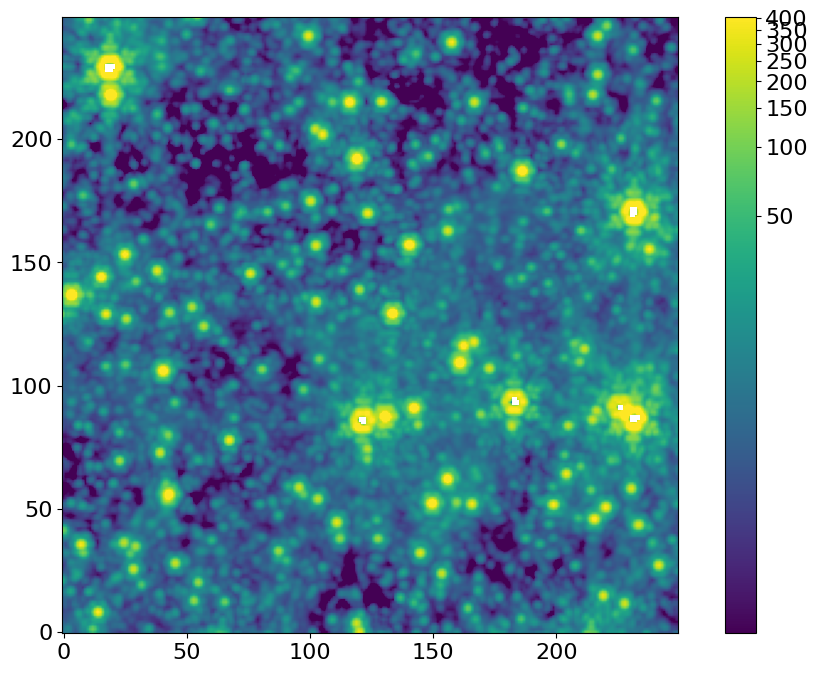

In [71]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(fh_410['SCI'].data [slc],
          norm=simple_norm(fh_410['SCI'].data [slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()

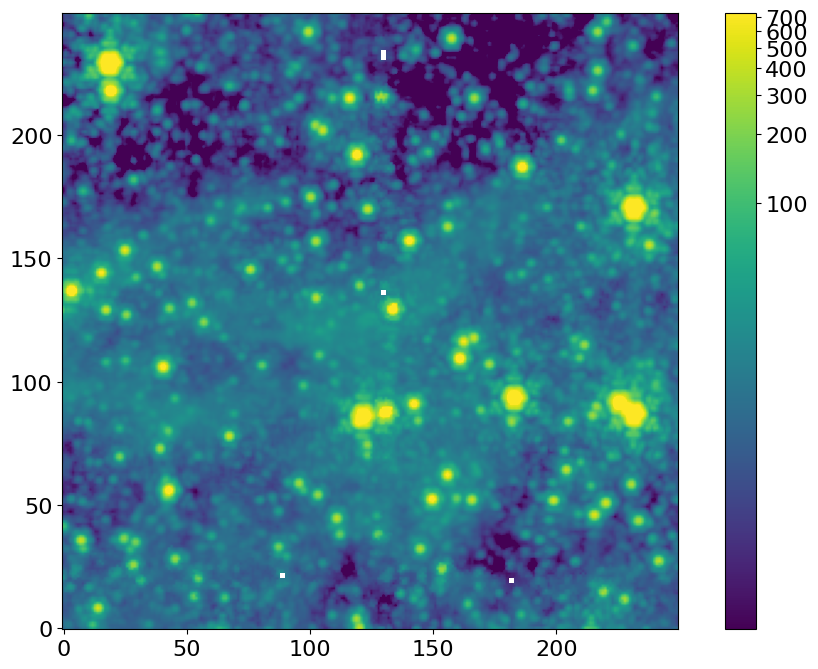

In [72]:
pl.figure(figsize=(12,8))
slc = slcgt()[1000:1250,1000:1250]
pl.imshow(data_405_proj_410_refit[slc],
          norm=simple_norm(data_405_proj_410_refit[slc], min_percent=4, max_percent=99.5, stretch='log'))
pl.colorbar()

### Try to find the right scaling factor for the stars

The above scaling factor assumed that the stellar flux in the BrA band matches that in the F410M band, which is only true if most stars do not have BrA absorption.

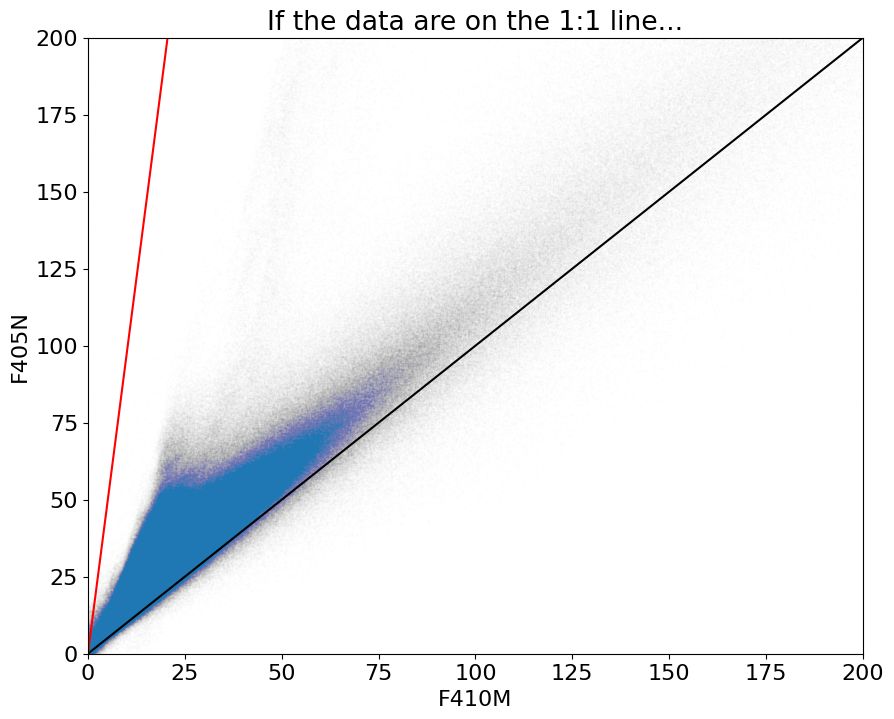

In [73]:
pl.scatter(fh_410['SCI'].data, data_405_proj_410_refit, s=1, alpha=0.005)
pl.plot([0,1000], [0,1000], color='k')
pl.plot([0,1000], [0,1000/fractional_bandwidth_405], color='r')
pl.axis([0,200,0,200]);
pl.xlabel("F410M")
pl.ylabel("F405N")
pl.title("If the data are on the 1:1 line...");

In [74]:
import mpl_plot_templates

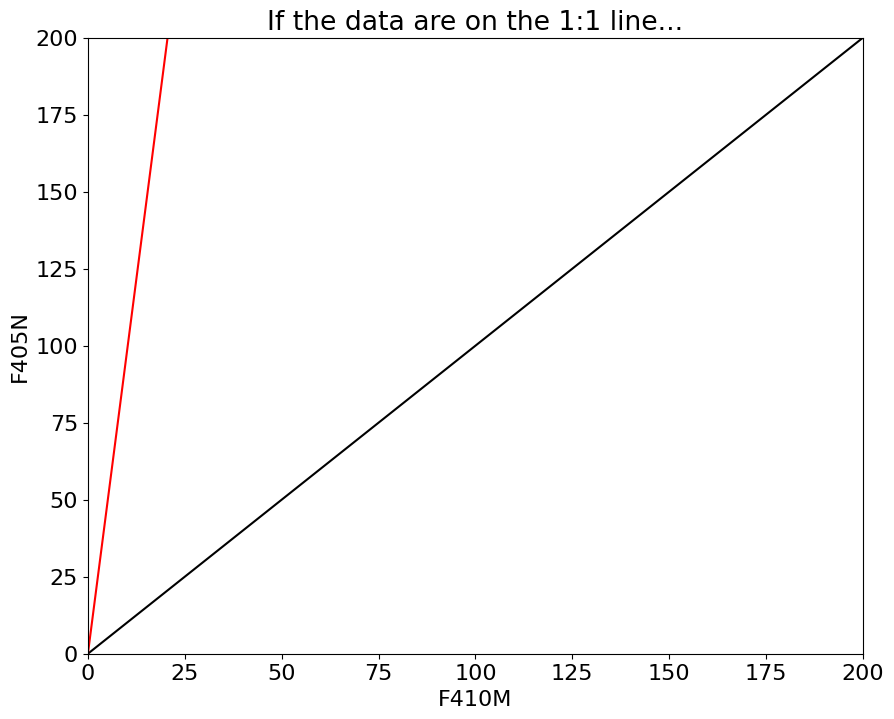

In [75]:
mpl_plot_templates.adaptive_param_plot(
    fh_410['SCI'].data.ravel(),
    data_405_proj_410_refit.ravel(),
    bins=100,
    marker=',')
pl.plot([0,1000], [0,1000], color='k')
pl.plot([0,1000], [0,1000/fractional_bandwidth_405], color='r')
pl.axis([0,200,0,200]);
pl.xlabel("F410M")
pl.ylabel("F405N")
pl.title("If the data are on the 1:1 line...");

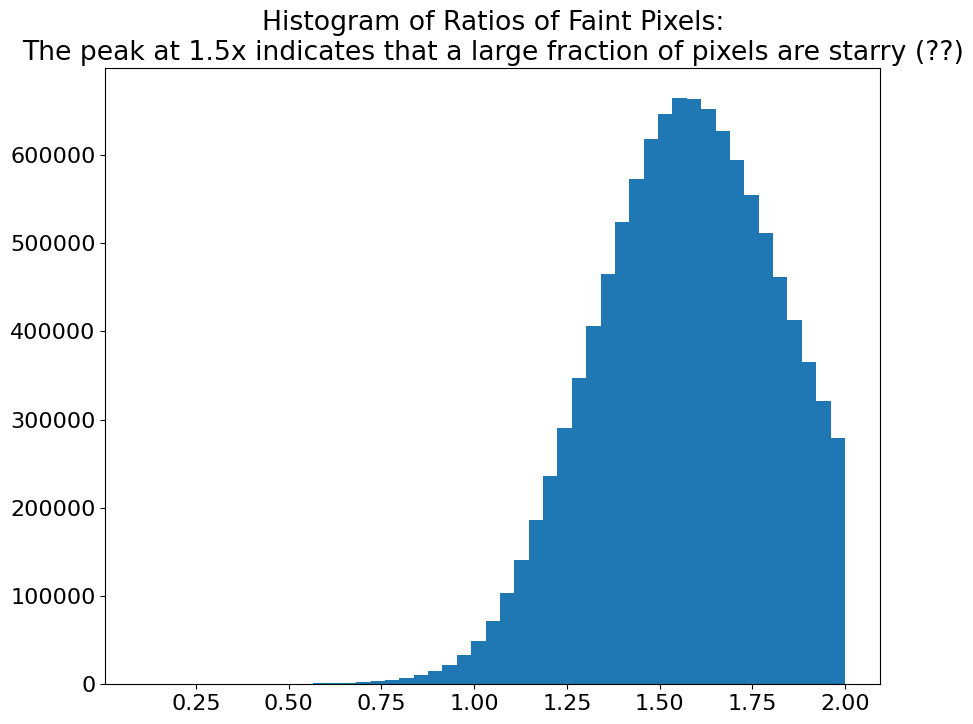

In [76]:
pl.hist((data_405_proj_410_refit / fh_410['SCI'].data)[(fh_410['SCI'].data < 200) & (data_405_proj_410_refit < 100)],
        bins=np.linspace(0.1,2));
pl.title("Histogram of Ratios of Faint Pixels:\nThe peak at 1.5x indicates that a large fraction of pixels are starry (??)");

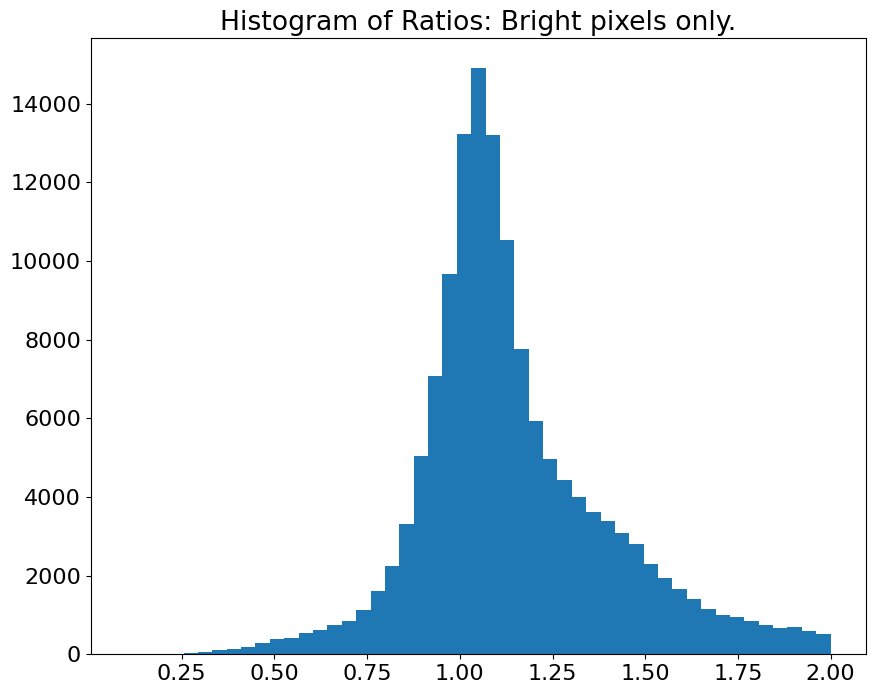

In [77]:
pl.hist((data_405_proj_410_refit / fh_410['SCI'].data)[(fh_410['SCI'].data > 200) & (data_405_proj_410_refit > 100)],
        bins=np.linspace(0.1,2));
pl.title("Histogram of Ratios: Bright pixels only.");

## Do F466N-cont now

In [101]:
# Dec 5, 2023:
# The long-wavelength pipeline-merged files have the best inter-frame alignment, but they needed to be realigned to VVV
# (realignment to refcat and VVV are indistinguishable, which is good)
fh_466 = fits.open(f'{basepath}/F466N/pipeline/jw02221-o001_t001_nircam_clear-f466n-merged_realigned-to-vvv.fits')
ww_466 = WCS(fh_466['SCI'].header)
data_466_proj_410, footprint = reproject.reproject_exact((fh_466['SCI'].data, ww_466), fh_410['SCI'].header)

Set OBSGEO-B to   -20.693175 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526785127.355 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


In [102]:
f466_minus_cont = data_466_proj_410 - 0.8*cont410_sub_bra #* fractional_bandwidth_466
fits.PrimaryHDU(data=f466_minus_cont,
                header=fh_410['SCI'].header).writeto(f'{basepath}/images/F466_minus_F410cont_merge_20231205.fits', overwrite=True)

In [103]:
data_466_proj_410[500:600,500:600]

array([[22.1931106 , 19.87255769, 17.31081799, ..., 13.95533433,
        13.5738549 , 12.23134931],
       [32.46601659, 21.08517978, 18.55745742, ..., 14.70223923,
        13.68445566, 13.23375257],
       [56.77988427, 25.75109435, 19.97505517, ..., 14.46665024,
        14.14692465, 13.8112911 ],
       ...,
       [13.0768781 , 12.74627517, 14.20481221, ..., 20.77099668,
        17.20432656, 20.73815279],
       [12.94036201, 12.44276034, 13.66361152, ..., 21.25856807,
        19.3741601 , 21.75732251],
       [13.88110476, 12.78695477, 13.59432825, ..., 19.28844687,
        18.05882302, 20.50832107]])

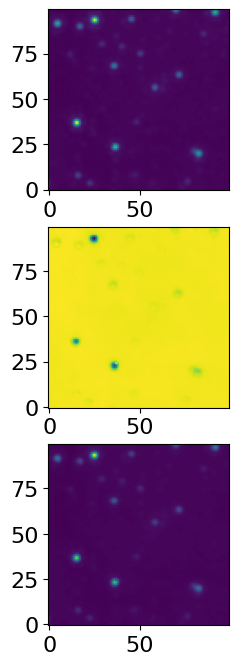

In [104]:
ax1 = pl.subplot(3,1,1)
ax1.imshow(data_466_proj_410[500:600,500:600])
ax2 = pl.subplot(3,1,2)
ax2.imshow(cont410_sub_bra[500:600,500:600])
ax3 = pl.subplot(3,1,3)
ax3.imshow(f466_minus_cont[500:600,500:600])

# Extra Work

## PSF comparison

There was evidence of oversubtraction / undersubtraction in rings around the stars in the 405-410 image before we did PSF convolution, so in this section, we do some investigation of the PSFs to see what kernel to use to match their resolution

In [80]:
import os
os.environ['WEBBPSF_PATH'] = '/orange/adamginsburg/jwst/webbpsf-data/'
import webbpsf
from webbpsf.utils import to_griddedpsfmodel

In [81]:
import sys
sys.path.append(f'{basepath}/reduction/')

In [82]:
import saturated_star_finding
import imp
imp.reload(saturated_star_finding)
from saturated_star_finding import get_psf

In [83]:
psf_bra = get_psf(fh_405['SCI'].header)

Attempting to load PSF for 2022-08-28
INFO: MAST API token accepted, welcome Adam Ginsburg [astroquery.mast.auth]

MAST OPD query around UTC: 2022-08-28T00:00:00.000
                        MJD: 59819.0

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022082702-NRCA3_FP1-1.fits
	Date (MJD):	 59817.7488
	Delta time:	 -1.2512 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022082902-NRCA3_FP1-1.fits
	Date (MJD):	 59819.7687
	Delta time:	 0.7687 days
User requested choosing OPD time closest in time to 2022-08-28T00:00:00.000, which is R2022082902-NRCA3_FP1-1.fits, delta time 0.769 days
Importing and format-converting OPD from /orange/adamginsburg/jwst/webbpsf-data/MAST_JWST_WSS_OPDs/R2022082902-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point
INFO: starfinding: Calculating grid for psf_fn=./nircam_F405N_samp2_nspsf16_npix512.fits [saturated_star_finding]

Running instrument: NIRCam, filter: F

In [84]:
psf_410 = get_psf(fh_410['SCI'].header)

Attempting to load PSF for 2022-08-28
INFO: MAST API token accepted, welcome Adam Ginsburg [astroquery.mast.auth]

MAST OPD query around UTC: 2022-08-28T00:00:00.000
                        MJD: 59819.0

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022082702-NRCA3_FP1-1.fits
	Date (MJD):	 59817.7488
	Delta time:	 -1.2512 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022082902-NRCA3_FP1-1.fits
	Date (MJD):	 59819.7687
	Delta time:	 0.7687 days
User requested choosing OPD time closest in time to 2022-08-28T00:00:00.000, which is R2022082902-NRCA3_FP1-1.fits, delta time 0.769 days
Importing and format-converting OPD from /orange/adamginsburg/jwst/webbpsf-data/MAST_JWST_WSS_OPDs/R2022082902-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point
INFO: starfinding: Calculating grid for psf_fn=./nircam_F410M_samp2_nspsf16_npix512.fits [saturated_star_finding]

Running instrument: NIRCam, filter: F

In [85]:
from astropy.visualization import imshow_norm, simple_norm, LogStretch, AsinhStretch

Text(0.5, 1.0, 'F405N-F410M')

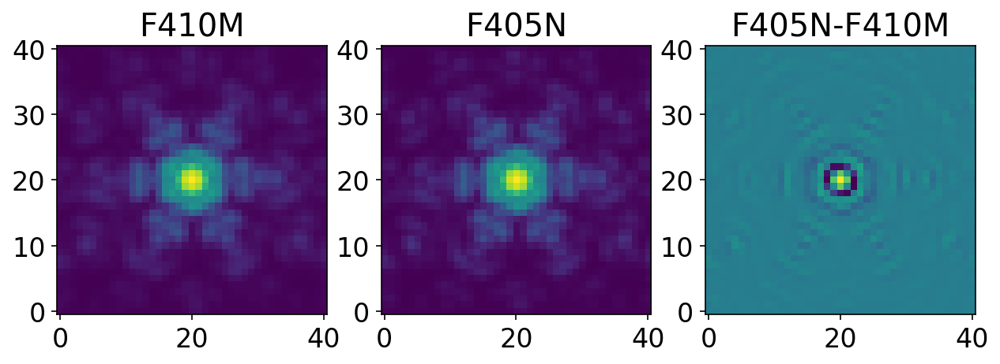

In [86]:
yy, xx = np.mgrid[-20:20.1:1,-20:20.1:1]
pl.figure(dpi=150)
ax = pl.subplot(1,3,1)
imshow_norm(psf_410(xx, yy), ax=ax, stretch=LogStretch())
ax.set_title("F410M")
ax = pl.subplot(1,3,2)
ax.set_title("F405N")
imshow_norm(psf_bra(xx, yy), ax=ax, stretch=LogStretch())
ax = pl.subplot(1,3,3)
imshow_norm(psf_bra(xx, yy) - psf_410(xx, yy), ax=ax, stretch=AsinhStretch())
ax.set_title("F405N-F410M")
#pl.suptitle("Comparison of WebbPSF F405N and F410M PSFs");

In [87]:
pb = psf_bra(xx, yy)
p4 = psf_410(xx, yy)
from astropy.convolution import convolve, convolve_fft, Gaussian2DKernel, AiryDisk2DKernel
def residual(x):
    return convolve(pb, Gaussian2DKernel(x)) - p4
def aresidual(x):
    return convolve(pb, AiryDisk2DKernel(x)) - p4

/blue/adamginsburg/adamginsburg/repos/astropy/astropy/convolution/kernels.py:171: RuntimeWarning: divide by zero encountered in scalar divide
  amplitude=1.0 / (2 * np.pi * x_stddev * y_stddev),
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/modeling/functional_models.py:475: RuntimeWarning: divide by zero encountered in divide
  a = 0.5 * ((cost2 / xstd2) + (sint2 / ystd2))
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/modeling/functional_models.py:475: RuntimeWarning: invalid value encountered in divide
  a = 0.5 * ((cost2 / xstd2) + (sint2 / ystd2))
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/modeling/functional_models.py:476: RuntimeWarning: invalid value encountered in divide
  b = 0.5 * ((sin2t / xstd2) - (sin2t / ystd2))
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/modeling/functional_models.py:477: RuntimeWarning: invalid value encountered in divide
  c = 0.5 * ((sint2 / xstd2) + (cost2 / ystd2))
/blue/adamginsburg/adamginsburg/repos/astropy/as

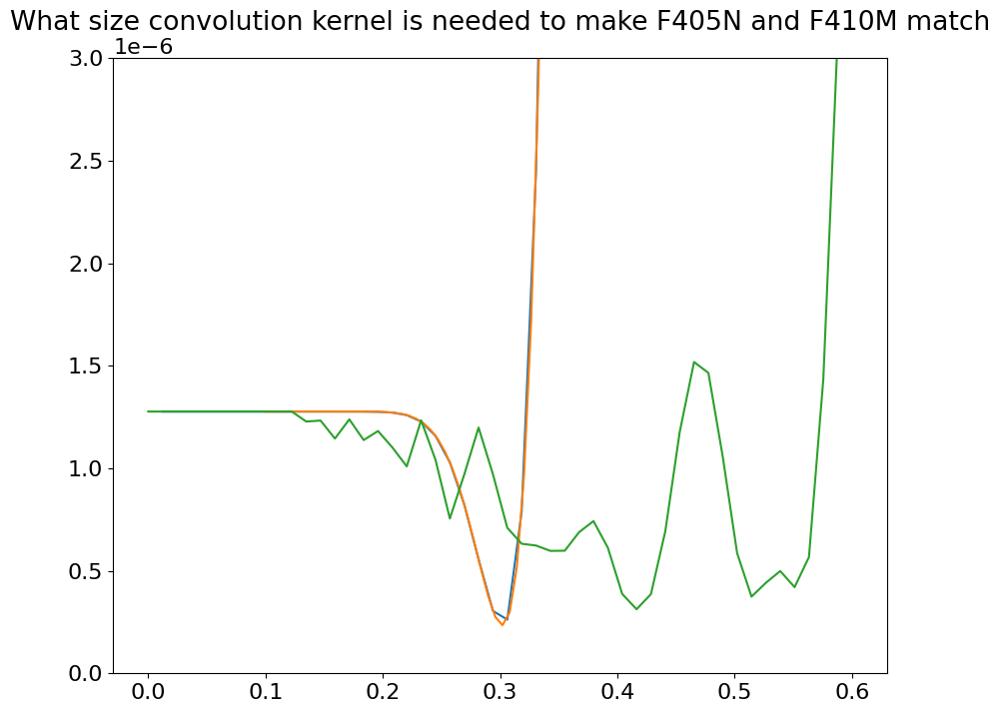

In [88]:
pl.plot(np.linspace(0,0.6), [(residual(x)**2).sum() for x in np.linspace(0,0.6)])
pl.plot(np.linspace(0.1,0.4), [(residual(x)**2).sum() for x in np.linspace(0.1,0.4)])
pl.plot(np.linspace(0,0.6), [(aresidual(x)**2).sum() for x in np.linspace(0,0.6)])
pl.ylim(0,0.000003);
pl.title("What size convolution kernel is needed to make F405N and F410M match");

In [89]:
resids = [(residual(x)**2).sum() for x in np.linspace(0.2,0.4)]
np.linspace(0.2,0.4)[np.argmin(resids)]

0.3020408163265306

The PSF difference is well-approximated as a Gaussian with sigma=0.3 pixels, apparently.

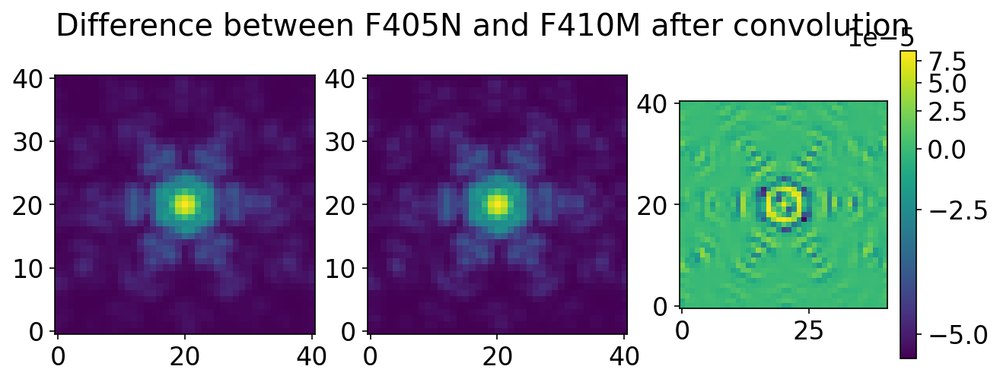

In [90]:
yy, xx = np.mgrid[-20:20.1:1,-20:20.1:1]
pl.figure(dpi=150, figsize=(10,3.5))
ax = pl.subplot(1,3,1)
imshow_norm(psf_410(xx, yy), ax=ax, stretch=LogStretch())
ax = pl.subplot(1,3,2)
imshow_norm(psf_bra(xx, yy), ax=ax, stretch=LogStretch())
ax = pl.subplot(1,3,3)
im, norm = imshow_norm(convolve(psf_bra(xx, yy), Gaussian2DKernel(0.3)) - psf_410(xx, yy), ax=ax, stretch=AsinhStretch())
pl.colorbar(mappable=im)
pl.suptitle("Difference between F405N and F410M after convolution");

In [91]:
Gaussian2DKernel(0.3, x_size=xx.shape[1], y_size=yy.shape[0]).array.shape

(41, 41)

### Attempt direct deconvolution

Maybe a Gaussian isn't the right kernel?


This section was exploratory and can basically be ignored.

In [92]:
ft4 = np.fft.fftshift(np.fft.fft2(psf_410(xx, yy)))
ftb = np.fft.fftshift(np.fft.fft2(psf_bra(xx, yy)))
ftk = np.fft.fftshift(np.fft.fft2(Gaussian2DKernel(0.3, x_size=xx.shape[1], y_size=yy.shape[0]).array))

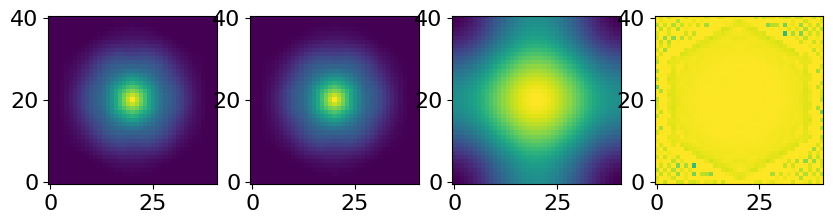

In [93]:
pl.figure(figsize=(10,3))
pl.subplot(1,4,1)
pl.imshow(np.abs(ftb))
pl.subplot(1,4,2)
pl.imshow(np.abs(ft4))
pl.subplot(1,4,3)
pl.imshow(np.abs(ftk))
pl.subplot(1,4,4)
pl.imshow(np.abs(ft4/ftb), vmin=0, vmax=1)

/orange/adamginsburg/miniconda3/envs/python39/lib/python3.9/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/orange/adamginsburg/miniconda3/envs/python39/lib/python3.9/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


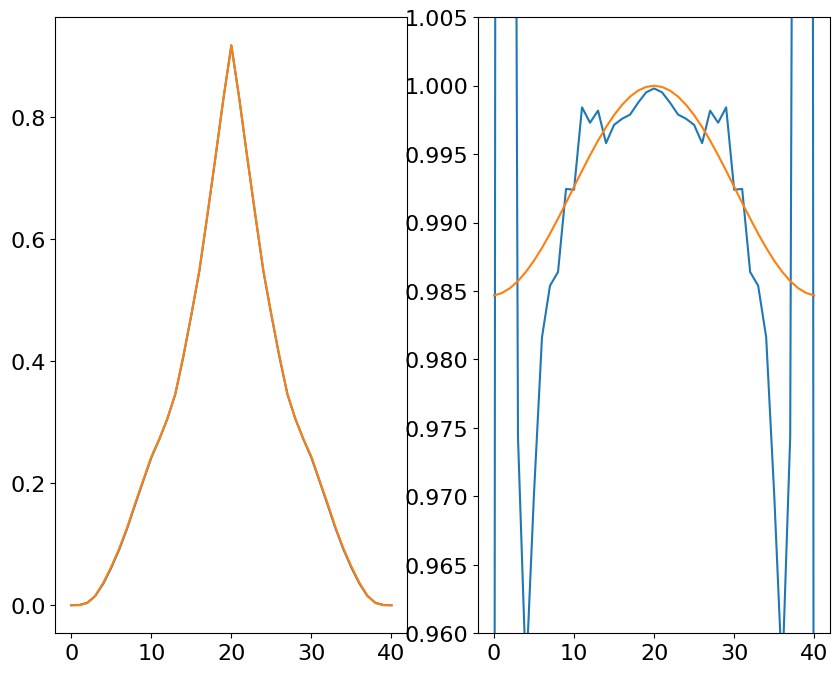

In [94]:
#im, norm = imshow_norm(np.abs(ft4)/np.abs(ftb) * np.abs(ftb) > 1e-3, stretch=AsinhStretch(), vmax=1.1, vmin=0.9)
#pl.colorbar(mappable=im)
pl.subplot(1,2,1)
pl.plot(np.abs((ft4[20,:])))
pl.plot(np.abs((ftb[20,:])))
pl.subplot(1,2,2)
pl.plot(np.abs((ft4[20,:])) / np.abs((ftb[20,:])))
pl.plot(np.abs(ftk[20,:]) / ftk.max())
pl.ylim(0.96, 1.005);

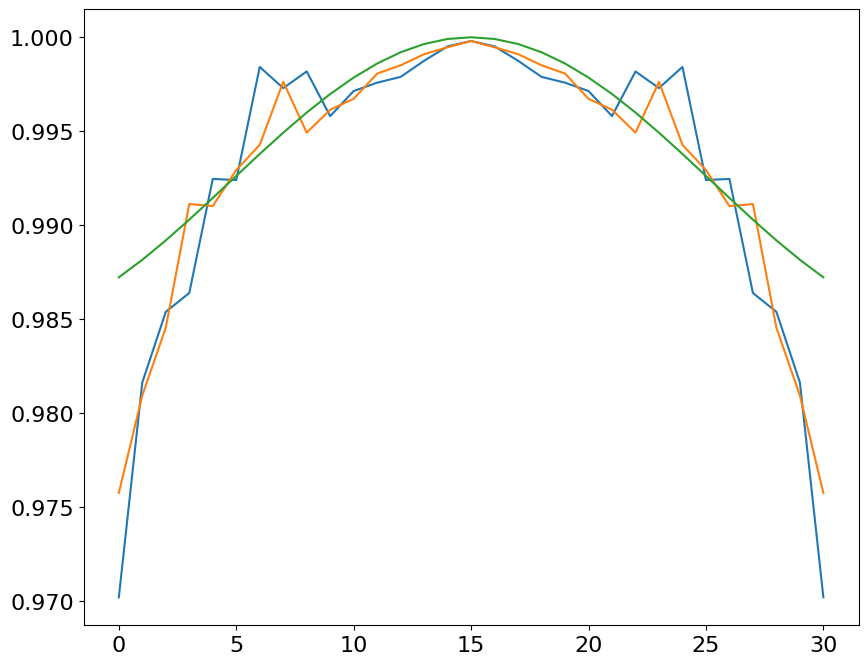

In [95]:
pl.plot((ft4[20,5:-5] / ftb[20,5:-5]))
pl.plot((ft4[5:-5,20] / ftb[5:-5,20]))
pl.plot(np.abs(ftk[5:-5,20])/np.abs(ftk).max())

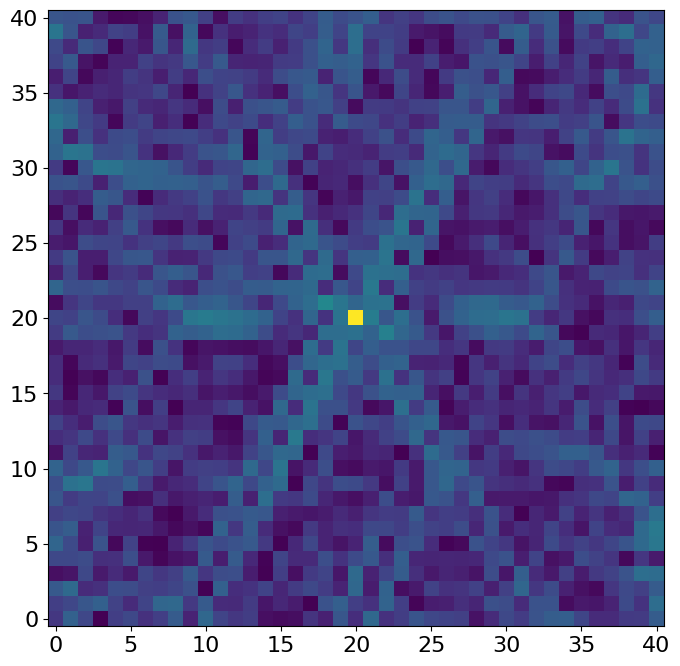

In [96]:
bra_to_410_kernel = np.abs((np.fft.fftshift(np.fft.fft2(ft4/ftb))))
bra_to_410_kernel /= bra_to_410_kernel.max()
imshow_norm(bra_to_410_kernel, stretch=LogStretch())
bra_to_410_kernel.max()
bra_to_410_kernel_ = np.zeros_like(bra_to_410_kernel)
bra_to_410_kernel_[15:25,15:25] = bra_to_410_kernel[15:25, 15:25]
bra_to_410_kernel = bra_to_410_kernel_

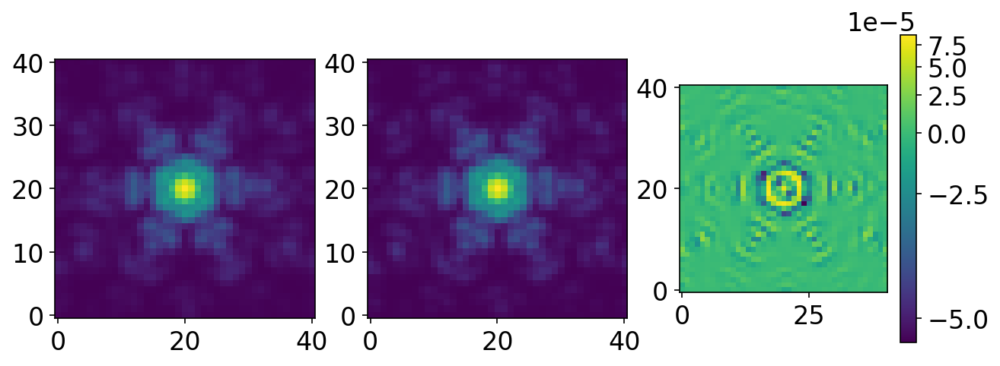

In [97]:
yy, xx = np.mgrid[-20:20.1:1,-20:20.1:1]
pl.figure(dpi=150, figsize=(10,3.5))
ax = pl.subplot(1,3,1)
imshow_norm(psf_410(xx, yy), ax=ax, stretch=LogStretch())
ax = pl.subplot(1,3,2)
imshow_norm(convolve(psf_bra(xx, yy), Gaussian2DKernel(0.3, x_size=41, y_size=41)), ax=ax, stretch=LogStretch())
ax = pl.subplot(1,3,3)
im, norm = imshow_norm(convolve(psf_bra(xx, yy), Gaussian2DKernel(0.3, x_size=41, y_size=41)) - psf_410(xx, yy), ax=ax, stretch=AsinhStretch())
pl.colorbar(mappable=im)

### Kernel

The BrA needs to be convolved with an 0.8469 * 0.1 pixel = 0.085 pixel Gaussian

or an 0.3469 * 0.5 = 0.017 pixel gaussian!?

or an 0.30 pixel gaussian?!